# PREPROCESSING & MODEL TRAINING

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# Load dataset from Google Drive directory
data_dir = '/content/drive/MyDrive/DATASET2/datasetKaggle'
categories = ['Closed', 'Open']
X = []
Y = []

In [ ]:
for category in categories:
    path = os.path.join(data_dir, category)
    label = categories.index(category)
    for img_name in os.listdir(path):
        img_path = os.path.join(path, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (32, 32))  # Resize to 32x32
        X.append(img)
        Y.append(label)

# Convert lists to numpy arrays
X = np.array(X)
Y = np.array(Y)

# Print class indices
print("Class indices:")
for category in categories:
    print(f"{category}: {categories.index(category)}")

Class indices:
Closed: 0
Open: 1


In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Print the number of files in each set and class distribution
print("Training set size:", len(X_train))
print("Testing set size:", len(X_test))
print("Class distribution in training set:", np.unique(Y_train, return_counts=True))
print("Class distribution in testing set:", np.unique(Y_test, return_counts=True))

Training set size: 1161
Testing set size: 291
Class distribution in training set: (array([0, 1]), array([578, 583]))
Class distribution in testing set: (array([0, 1]), array([148, 143]))


In [ ]:
# Convert class labels to one-hot encoded vectors
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

# Data augmentation for training set
train_aug = ImageDataGenerator(rotation_range=20, zoom_range=0.2, horizontal_flip=True)
train_aug.fit(X_train)

In [ ]:
# Define the model architecture
input_shape = (32, 32, 3)  # Input shape for images
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    Conv2D(32, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    MaxPool2D((2, 2), strides=(2, 2)),
    Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2), strides=(2, 2)),
    Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    MaxPool2D((2, 2), strides=(2, 2)),
    Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu'),
    BatchNormalization(),
    Dropout(0.4),
    MaxPool2D((2, 2), strides=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        896       
                                                                 
 batch_normalization (Batch  (None, 32, 32, 32)        128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_1 (Bat  (None, 32, 32, 32)        128       
 chNormalization)                                                
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 16, 16, 32)        0

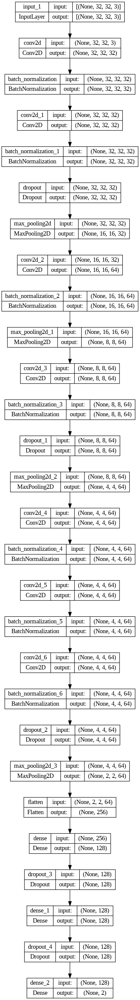

In [ ]:
plot_model(model, to_file = '/content/drive/MyDrive/DATASET2/datasetKaggle/Architecture200.png',
           show_shapes=True, show_layer_names=True)

In [ ]:
# Train the model
history = model.fit(train_aug.flow(X_train, Y_train, batch_size=32),
                    epochs=200,
                    validation_data=(X_test, Y_test))

Epoch 1/200
37/37 [==============================] - 12s 56ms/step - loss: 1.5929 - accuracy: 0.5116 - val_loss: 0.6680 - val_accuracy: 0.5120
Epoch 2/200
37/37 [==============================] - 1s 26ms/step - loss: 1.0896 - accuracy: 0.5883 - val_loss: 0.6331 - val_accuracy: 0.6323
Epoch 3/200
37/37 [==============================] - 1s 22ms/step - loss: 0.9639 - accuracy: 0.6055 - val_loss: 0.5720 - val_accuracy: 0.7938
Epoch 4/200
37/37 [==============================] - 1s 22ms/step - loss: 0.7488 - accuracy: 0.6736 - val_loss: 0.5113 - val_accuracy: 0.8316
Epoch 5/200
37/37 [==============================] - 1s 22ms/step - loss: 0.8349 - accuracy: 0.6494 - val_loss: 0.4430 - val_accuracy: 0.8282
Epoch 6/200
37/37 [==============================] - 1s 22ms/step - loss: 0.6670 - accuracy: 0.7287 - val_loss: 0.3962 - val_accuracy: 0.8385
Epoch 7/200
37/37 [==============================] - 1s 22ms/step - loss: 0.5933 - accuracy: 0.7476 - val_loss: 0.3519 - val_accuracy: 0.8385
Epoch

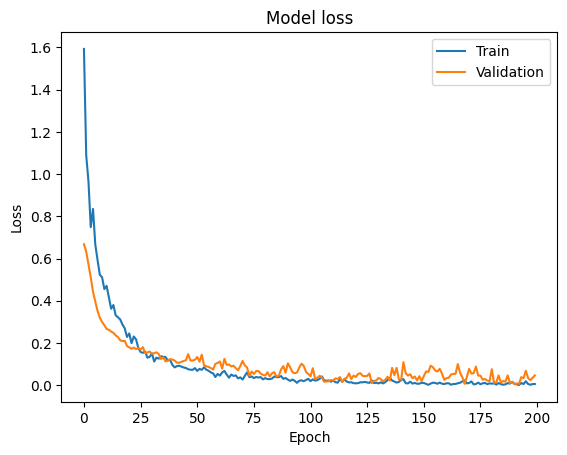

In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

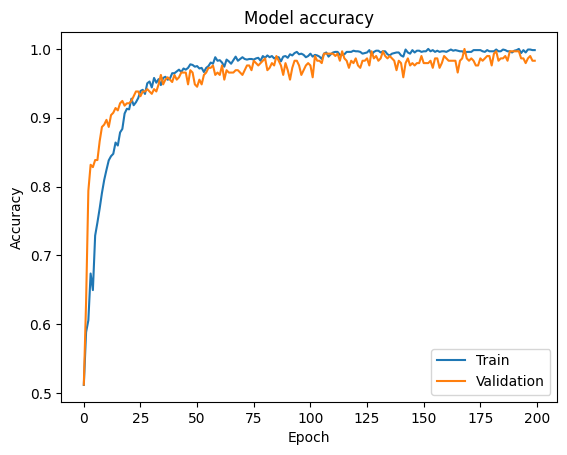

In [ ]:
# Plot training history
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Evaluate the model on test set
test_loss, test_acc = model.evaluate(X_test, Y_test)
print(f'Test Set Accuracy: {test_acc:.4f}')
print(f'Test Set Loss: {test_loss:.4f}')

10/10 [==============================] - 0s 5ms/step - loss: 0.0467 - accuracy: 0.9828
Test Set Accuracy: 0.9828
Test Set Loss: 0.0467


10/10 [==============================] - 0s 3ms/step
Classification Report:
              precision    recall  f1-score   support

      Closed       1.00      0.97      0.98       148
        Open       0.97      1.00      0.98       143

    accuracy                           0.98       291
   macro avg       0.98      0.98      0.98       291
weighted avg       0.98      0.98      0.98       291



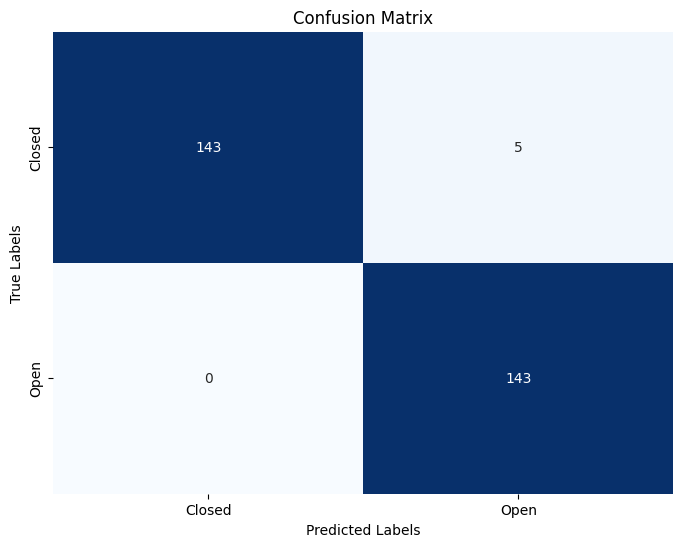

In [ ]:
# Generate classification report
Y_pred = model.predict(X_test)
y_pred = np.argmax(Y_pred, axis=1)
print("Classification Report:")
print(classification_report(np.argmax(Y_test, axis=1), y_pred, target_names=categories))

# Plot confusion matrix
conf_mat = confusion_matrix(np.argmax(Y_test, axis=1), y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(ticks=np.arange(len(categories))+0.5, labels=categories)
plt.yticks(ticks=np.arange(len(categories))+0.5, labels=categories)
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/DATASET2/datasetKaggle/BestModel200.keras')

# PREDICTIONS

1/1 [==============================] - 0s 374ms/step


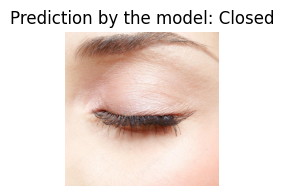

1/1 [==============================] - 0s 30ms/step


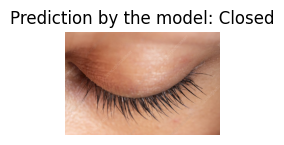

1/1 [==============================] - 0s 34ms/step


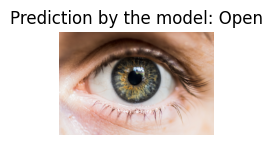

1/1 [==============================] - 0s 45ms/step


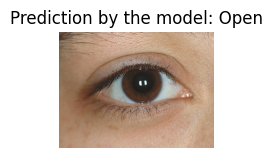

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Define the labels
labels = ['Closed', 'Open']

# Load the model
model = load_model('/content/drive/MyDrive/DATASET2/datasetKaggle/BestModel200.keras')

# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    # Load the image
    img = cv2.imread(image_path)
    # Resize the image to the required input size
    input_size = (32, 32)
    img = cv2.resize(img, input_size)
    # Convert image to numpy array
    img = np.array(img)
    # Add batch dimension to the image
    img = np.expand_dims(img, axis=0)
    return img

# Function to display an image with its prediction
def display_image_with_prediction(image_path):
    # Load and preprocess the image
    img = load_and_preprocess_image(image_path)
    # Make prediction on the image
    prediction = model.predict(img)
    # Display the image with its prediction
    plt.figure(figsize=(2, 2))
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.axis('off')
    plt.title(f'Prediction by the model: {labels[np.argmax(prediction[0], axis=0)]}')
    plt.show()

# Image paths
image_paths = ['/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed_eye.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed_eye2.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open1.jpg']

# Display images with predictions
for image_path in image_paths:
    display_image_with_prediction(image_path)


1/1 [==============================] - 1s 611ms/step


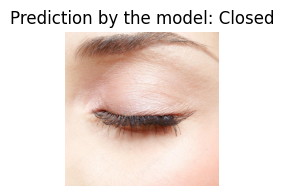

1/1 [==============================] - 0s 90ms/step


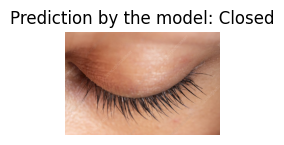

1/1 [==============================] - 0s 56ms/step


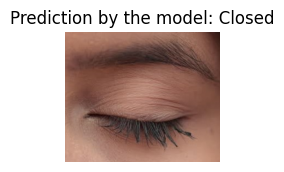

1/1 [==============================] - 0s 66ms/step


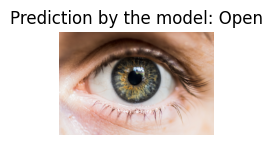

1/1 [==============================] - 0s 39ms/step


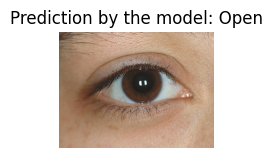

1/1 [==============================] - 0s 72ms/step


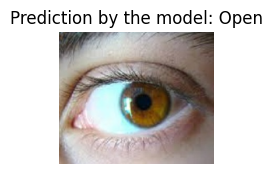

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Define the labels
labels = ['Closed', 'Open']

# Load the model
model = load_model('/content/drive/MyDrive/DATASET2/datasetKaggle/BestModel200.keras')

# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    # Load the image
    img = cv2.imread(image_path)
    # Resize the image to the required input size
    input_size = (32, 32)
    img = cv2.resize(img, input_size)
    # Convert image to numpy array
    img = np.array(img)
    # Add batch dimension to the image
    img = np.expand_dims(img, axis=0)
    return img

# Function to display an image with its prediction
def display_image_with_prediction(image_path):
    # Load and preprocess the image
    img = load_and_preprocess_image(image_path)
    # Make prediction on the image
    prediction = model.predict(img)
    # Display the image with its prediction
    plt.figure(figsize=(2, 2))
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.axis('off')
    plt.title(f'Prediction by the model: {labels[np.argmax(prediction[0], axis=0)]}')
    plt.show()

# Image paths
image_paths = ['/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed1.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed2.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open1.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open2.jpg']

# Display images with predictions
for image_path in image_paths:
    display_image_with_prediction(image_path)


1/1 [==============================] - 0s 47ms/step


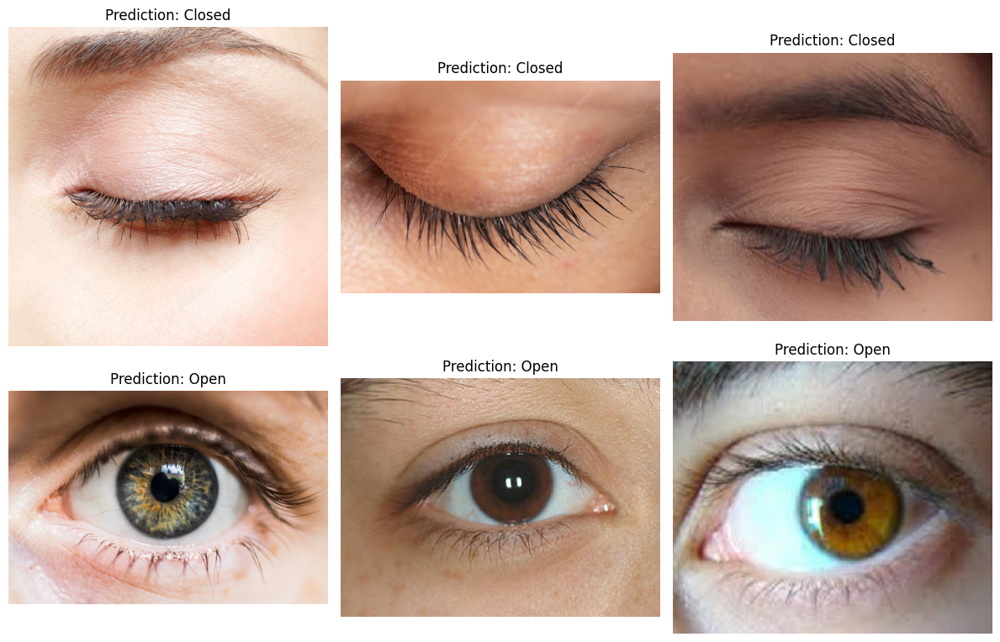

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Define the labels
labels = ['Closed', 'Open']

# Load the model
model = load_model('/content/drive/MyDrive/DATASET2/datasetKaggle/BestModel200.keras')

# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    # Load the image
    img = cv2.imread(image_path)
    # Resize the image to the required input size
    input_size = (32, 32)
    img = cv2.resize(img, input_size)
    # Convert image to numpy array
    img = np.array(img)
    # Add batch dimension to the image
    img = np.expand_dims(img, axis=0)
    return img

def display_images_with_predictions(image_paths):
    num_images = len(image_paths)
    num_rows = (num_images + 2) // 3  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, 3, figsize=(12, num_rows * 4))  # Create subplots

    for idx, image_path in enumerate(image_paths):
        # Calculate the subplot position
        row = idx // 3
        col = idx % 3
        ax = axs[row, col]

        # Load and preprocess the image
        img = load_and_preprocess_image(image_path)
        # Make prediction on the image
        prediction = model.predict(img)

        # Display the image with its prediction
        ax.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
        ax.axis('off')
        ax.set_title(f'Prediction: {labels[np.argmax(prediction[0], axis=0)]}')

    # Adjust spacing and display the plot
    plt.tight_layout()
    plt.show()

# Image paths
image_paths = ['/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed1.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed2.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open1.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open2.jpg']

# Display images with predictions
display_images_with_predictions(image_paths)


1/1 [==============================] - 0s 42ms/step


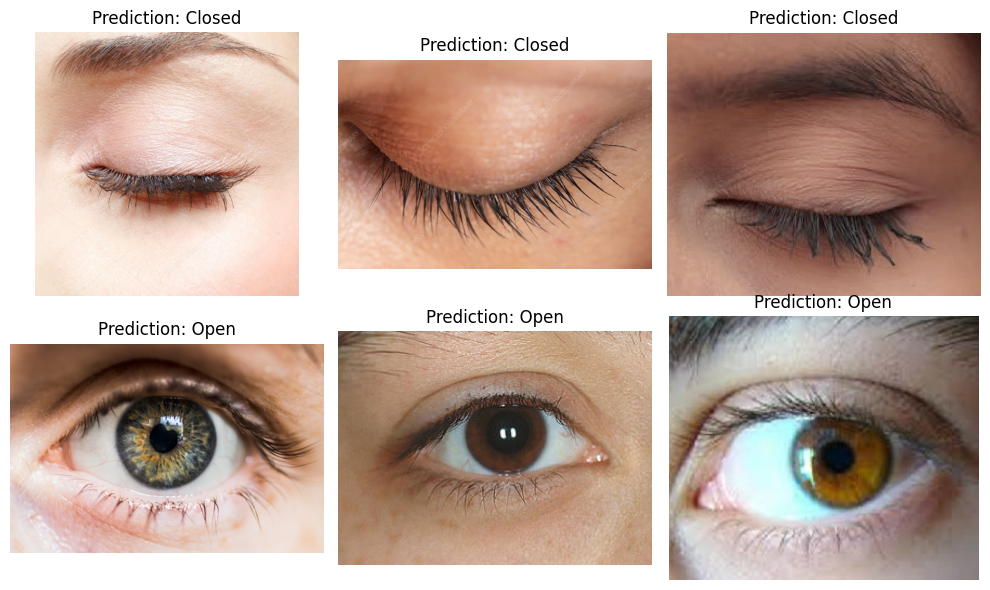

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Define the labels
labels = ['Closed', 'Open']

# Load the model
model = load_model('/content/drive/MyDrive/DATASET2/datasetKaggle/BestModel200.keras')

# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    # Load the image
    img = cv2.imread(image_path)
    # Resize the image to the required input size
    input_size = (32, 32)
    img = cv2.resize(img, input_size)
    # Convert image to numpy array
    img = np.array(img)
    # Add batch dimension to the image
    img = np.expand_dims(img, axis=0)
    return img

def display_images_with_predictions(image_paths):
    num_images = len(image_paths)
    num_rows = (num_images + 2) // 3  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, 3, figsize=(10, num_rows * 3))  # Adjust figsize for overall plot size

    for idx, image_path in enumerate(image_paths):
        # Calculate the subplot position
        row = idx // 3
        col = idx % 3
        ax = axs[row, col]

        # Load and preprocess the image
        img = load_and_preprocess_image(image_path)
        # Make prediction on the image
        prediction = model.predict(img)

        # Display the image with its prediction
        ax.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
        ax.axis('off')
        ax.set_title(f'Prediction: {labels[np.argmax(prediction[0], axis=0)]}')

    # Adjust spacing and display the plot
    plt.tight_layout()
    plt.show()

# Image paths
image_paths = ['/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed1.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/closed2.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open0.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open1.jpg',
               '/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/open2.jpg']

# Display images with predictions
display_images_with_predictions(image_paths)


# FULL FACE

In [ ]:
import numpy as np
import cv2
from collections import OrderedDict
import dlib
import imutils
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Constants for facial landmarks indices
#For dlib’s 68-point facial landmark detector:
FACIAL_LANDMARKS_68_IDXS = OrderedDict([
	("mouth", (48, 68)),
	("inner_mouth", (60, 68)),
	("right_eyebrow", (17, 22)),
	("left_eyebrow", (22, 27)),
	("right_eye", (36, 42)),
	("left_eye", (42, 48)),
	("nose", (27, 36)),
	("jaw", (0, 17))
])

#For dlib’s 5-point facial landmark detector:
FACIAL_LANDMARKS_5_IDXS = OrderedDict([
	("right_eye", (2, 3)),
	("left_eye", (0, 1)),
	("nose", (4))
])

# in order to support legacy code, we'll default the indexes to the
# 68-point model
FACIAL_LANDMARKS_IDXS = FACIAL_LANDMARKS_68_IDXS  # Default to 68-point model

def rect_to_bb(rect):
	# take a bounding predicted by dlib and convert it
	# to the format (x, y, w, h) as we would normally do
	# with OpenCV
	x = rect.left()
	y = rect.top()
	w = rect.right() - x
	h = rect.bottom() - y

	# return a tuple of (x, y, w, h)
	return (x, y, w, h)

def shape_to_np(shape, dtype="int"):
	# initialize the list of (x, y)-coordinates
	coords = np.zeros((shape.num_parts, 2), dtype=dtype)

	# loop over all facial landmarks and convert them
	# to a 2-tuple of (x, y)-coordinates
	for i in range(0, shape.num_parts):
		coords[i] = (shape.part(i).x, shape.part(i).y)

	# return the list of (x, y)-coordinates
	return coords

def visualize_facial_landmarks(image, shape, colors=None, alpha=0.75):
	# create two copies of the input image -- one for the
	# overlay and one for the final output image
	overlay = image.copy()
	output = image.copy()

	# if the colors list is None, initialize it with a unique
	# color for each facial landmark region
	if colors is None:
		colors = [(19, 199, 109), (79, 76, 240), (230, 159, 23),
			(168, 100, 168), (158, 163, 32),
			(163, 38, 32), (180, 42, 220), (0, 0, 255)]

	# loop over the facial landmark regions individually
	for (i, name) in enumerate(FACIAL_LANDMARKS_IDXS.keys()):
		# grab the (x, y)-coordinates associated with the
		# face landmark
		(j, k) = FACIAL_LANDMARKS_IDXS[name]
		pts = shape[j:k]

		# check if are supposed to draw the jawline
		if name == "jaw":
			# since the jawline is a non-enclosed facial region,
			# just draw lines between the (x, y)-coordinates
			for l in range(1, len(pts)):
				ptA = tuple(pts[l - 1])
				ptB = tuple(pts[l])
				cv2.line(overlay, ptA, ptB, colors[i], 2)

		# otherwise, compute the convex hull of the facial
		# landmark coordinates points and display it
		else:
			hull = cv2.convexHull(pts)
			cv2.drawContours(overlay, [hull], -1, colors[i], -1)

	# apply the transparent overlay
	cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

	# return the output image
	return output

In [ ]:
class FaceAligner:
    def __init__(self, predictor, desiredLeftEye=(0.35, 0.35),
                 desiredFaceWidth=256, desiredFaceHeight=None):
        self.predictor = predictor
        self.desiredLeftEye = desiredLeftEye
        self.desiredFaceWidth = desiredFaceWidth
        self.desiredFaceHeight = desiredFaceHeight

        if self.desiredFaceHeight is None:
            self.desiredFaceHeight = self.desiredFaceWidth

    def align(self, image, gray, rect):
        shape = self.predictor(gray, rect)
        shape = shape_to_np(shape)

        if len(shape) == 68:
            (lStart, lEnd) = FACIAL_LANDMARKS_68_IDXS["left_eye"]
            (rStart, rEnd) = FACIAL_LANDMARKS_68_IDXS["right_eye"]
        else:
            (lStart, lEnd) = FACIAL_LANDMARKS_5_IDXS["left_eye"]
            (rStart, rEnd) = FACIAL_LANDMARKS_5_IDXS["right_eye"]

        leftEyePts = shape[lStart:lEnd]
        rightEyePts = shape[rStart:rEnd]

        leftEyeCenter = leftEyePts.mean(axis=0).astype("int")
        rightEyeCenter = rightEyePts.mean(axis=0).astype("int")

        dY = rightEyeCenter[1] - leftEyeCenter[1]
        dX = rightEyeCenter[0] - leftEyeCenter[0]
        angle = np.degrees(np.arctan2(dY, dX)) - 180

        desiredRightEyeX = 1.0 - self.desiredLeftEye[0]

        dist = np.sqrt((dX ** 2) + (dY ** 2))
        desiredDist = (desiredRightEyeX - self.desiredLeftEye[0])
        desiredDist *= self.desiredFaceWidth
        scale = desiredDist / dist

        eyesCenter = ((leftEyeCenter[0] + rightEyeCenter[0]) // 2,
                      (leftEyeCenter[1] + rightEyeCenter[1]) // 2)

        # Ensure that eyesCenter contains integer values
        eyesCenter = (int(eyesCenter[0]), int(eyesCenter[1]))

        M = cv2.getRotationMatrix2D(eyesCenter, angle, scale)

        tX = self.desiredFaceWidth * 0.5
        tY = self.desiredFaceHeight * self.desiredLeftEye[1]
        M[0, 2] += (tX - eyesCenter[0])
        M[1, 2] += (tY - eyesCenter[1])

        (w, h) = (self.desiredFaceWidth, self.desiredFaceHeight)
        output = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC)

        return output

In [ ]:
def full_face_detection_pipeline(input_image_path):
    # Load models and classifiers
    face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/tools/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/tools/haarcascade_eye.xml')
    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/tools/shape_predictor_68_face_landmarks.dat')
    model = load_model('/content/drive/MyDrive/DATASET2/datasetKaggle/BestModel200.keras')

    # Initialize FaceAligner
    fa = FaceAligner(predictor, desiredFaceWidth=256)

    # Load and process test image
    test_image = cv2.imread(input_image_path)
    test_image = imutils.resize(test_image, width=800)
    test_image_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)
    rects = detector(test_image_gray, 2)

    for rect in rects:
        # Face alignment and eye detection code
        (x, y, w, h) = rect_to_bb(rect)
        faceOrig = imutils.resize(test_image[y:y+h, x:x+w], width=256)
        faceAligned = fa.align(test_image, test_image_gray, rect)
        faceAligned_gray = cv2.cvtColor(faceAligned, cv2.COLOR_BGR2GRAY)
        plt.imshow(faceAligned_gray)
        plt.axis('off')
        plt.title('Aligned Face')
        plt.show()
        eyes = eye_cascade.detectMultiScale(faceAligned_gray, 1.1, 4)
        predictions = []
        for (ex, ey, ew, eh) in eyes:
            eye = faceAligned[ey:ey+eh, ex:ex+ew]
            eye = cv2.resize(eye, (32, 32))
            eye = np.array(eye)
            eye = np.expand_dims(eye, axis=0)
            ypred = model.predict(eye)
            ypred = np.argmax(ypred[0], axis=0)
            predictions.append(ypred)
        if all(i==0 for i in predictions):
            cv2.rectangle(test_image, (x, y), (x+w, y+h), (0, 0, 255), 8)
            cv2.putText(test_image, 'Sleeping', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 255), 3)
        else:
            cv2.rectangle(test_image, (x, y), (x+w, y+h), (0, 255, 0), 8)
            cv2.putText(test_image, 'Non Sleeping', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)
    output_path = '/content/test_image_prediction.jpg'
    cv2.imwrite(output_path, test_image)
    return output_path

# ACTIVE

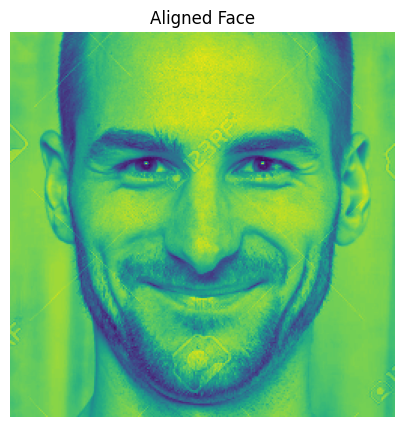

1/1 [==============================] - 0s 47ms/step


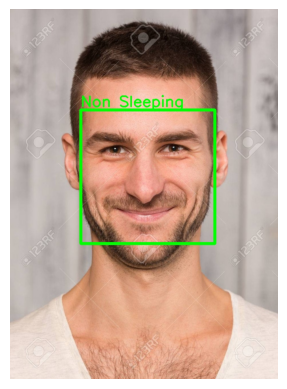

In [ ]:
# Display the processed image
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active1.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

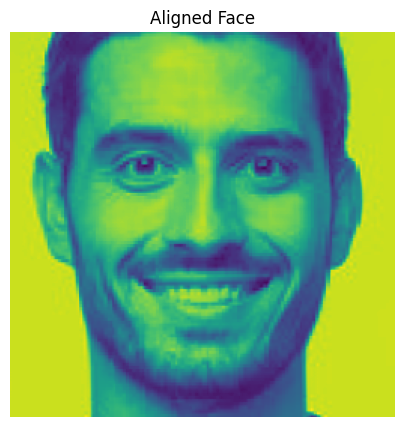

1/1 [==============================] - 0s 44ms/step


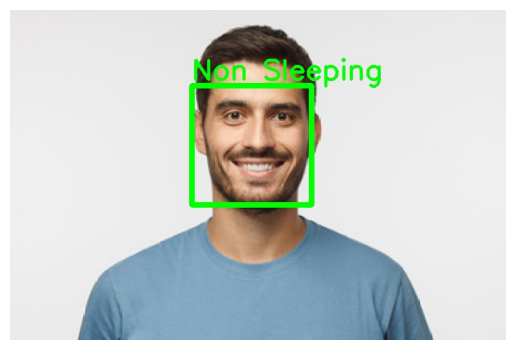

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active2.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

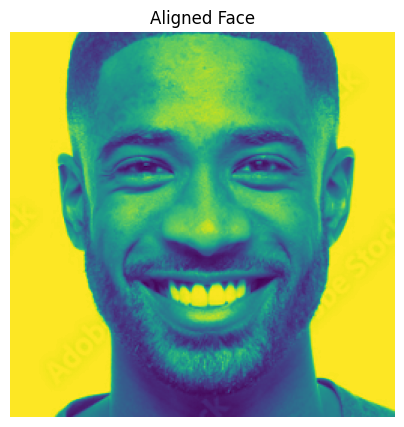

1/1 [==============================] - 0s 40ms/step


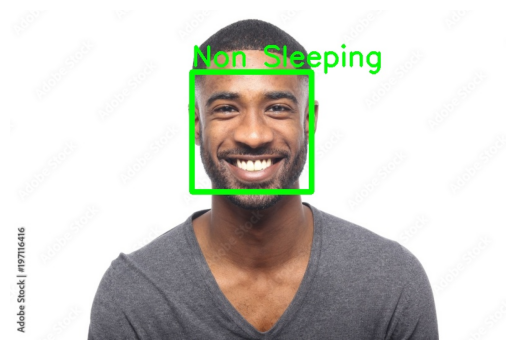

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active3.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

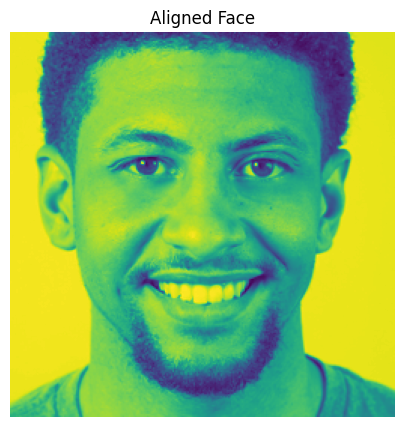

1/1 [==============================] - 0s 23ms/step


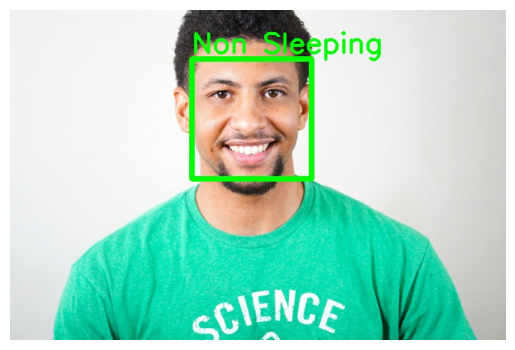

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active4.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

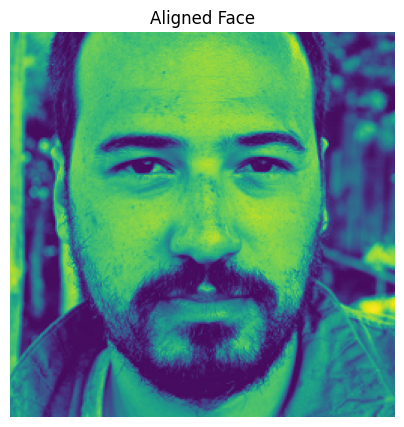

1/1 [==============================] - 0s 34ms/step


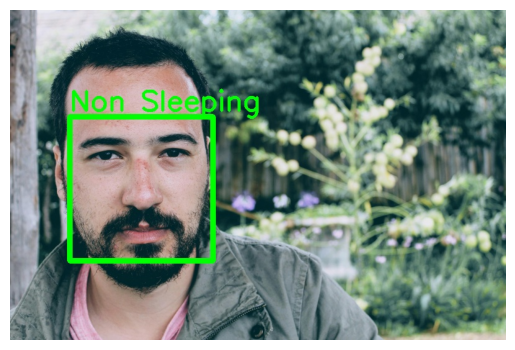

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active5.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

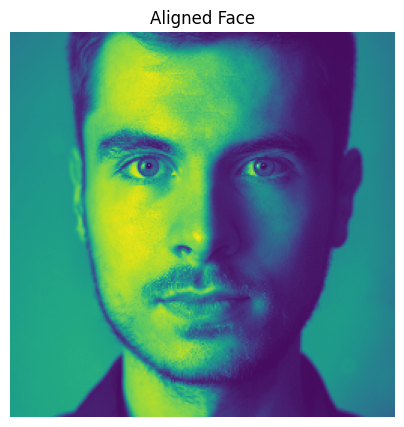

1/1 [==============================] - 0s 23ms/step


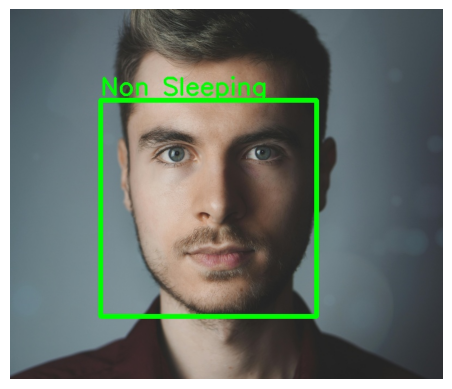

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active6.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

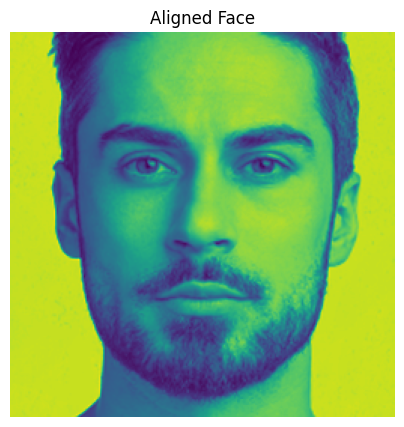

1/1 [==============================] - 0s 43ms/step


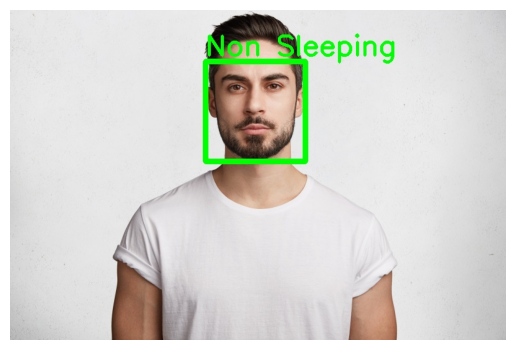

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active7.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

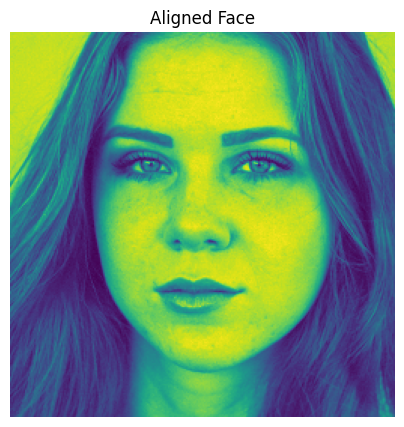

1/1 [==============================] - 0s 22ms/step


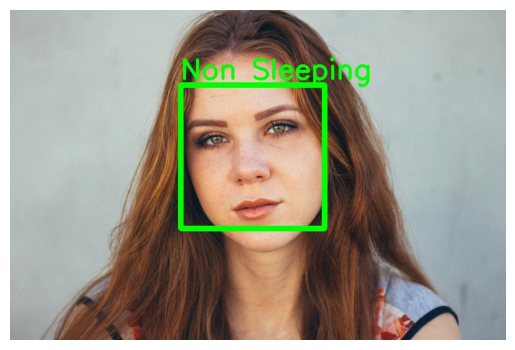

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active8.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

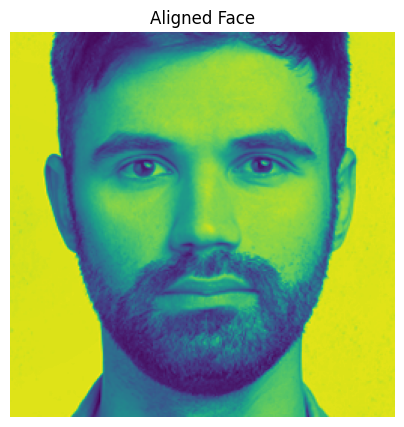

1/1 [==============================] - 0s 27ms/step


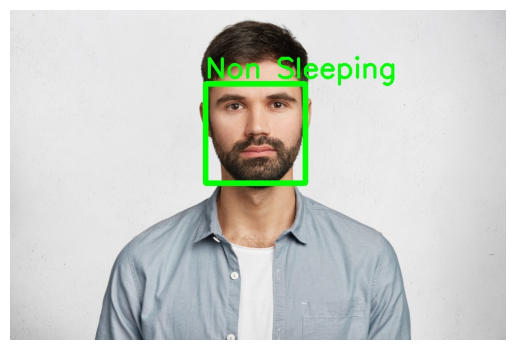

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active9.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

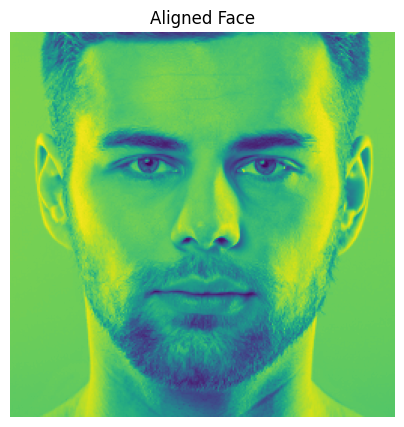

1/1 [==============================] - 0s 22ms/step


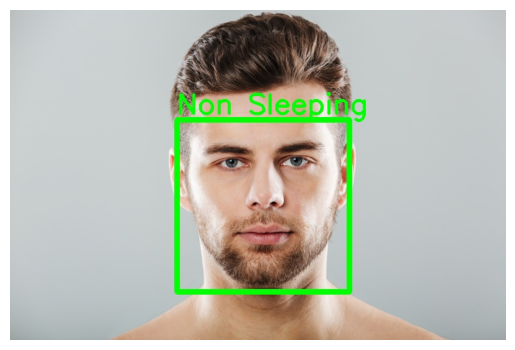

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/active10.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

# Drowsy

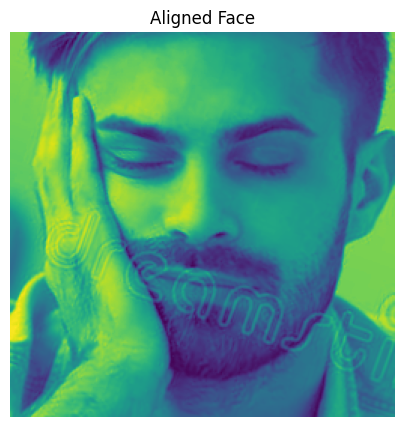

1/1 [==============================] - 0s 40ms/step


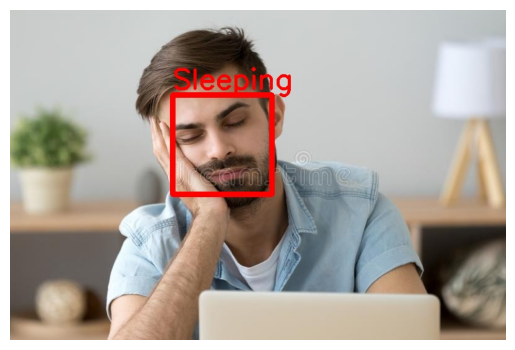

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy1.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

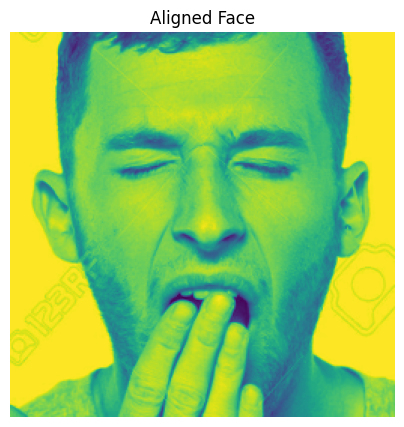

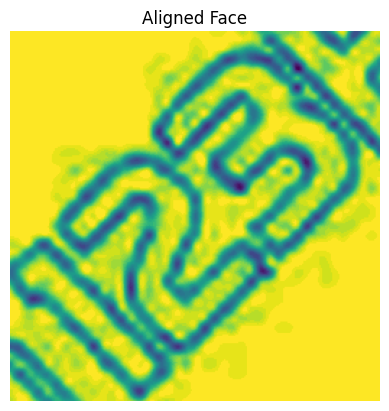

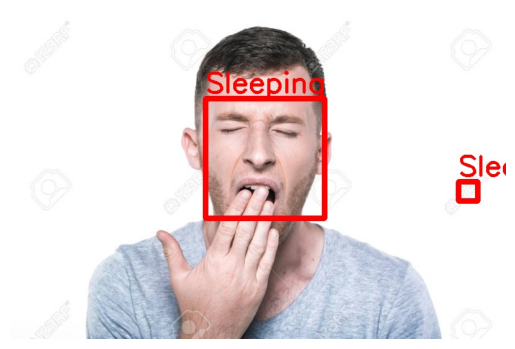

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy2.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

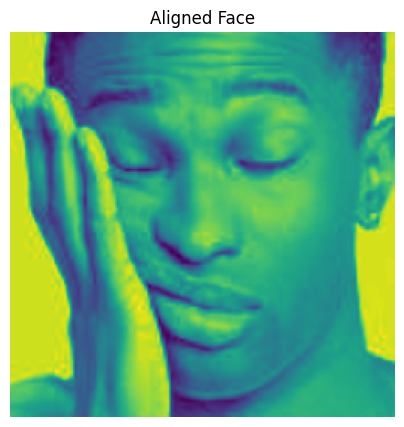

1/1 [==============================] - 0s 27ms/step


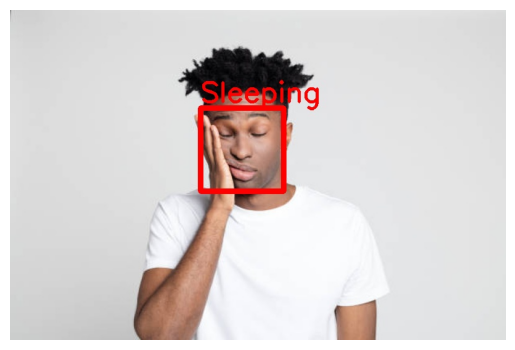

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy3.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

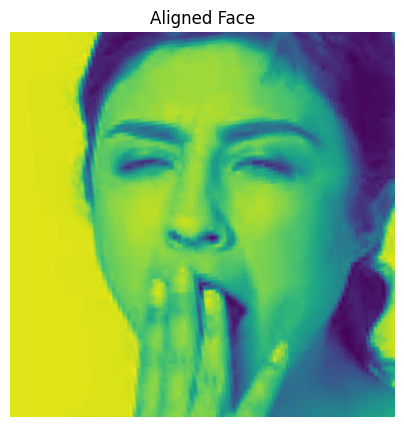

1/1 [==============================] - 0s 24ms/step


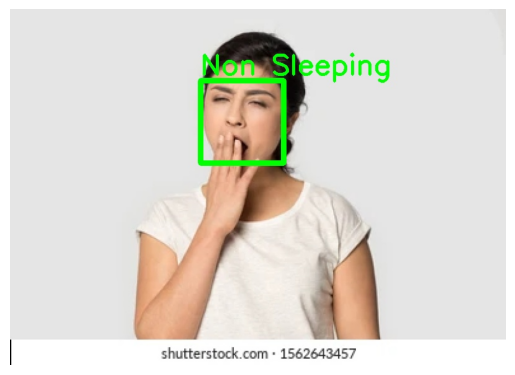

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy4.webp'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

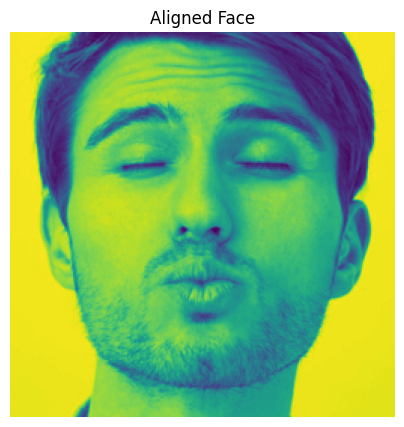

1/1 [==============================] - 0s 46ms/step


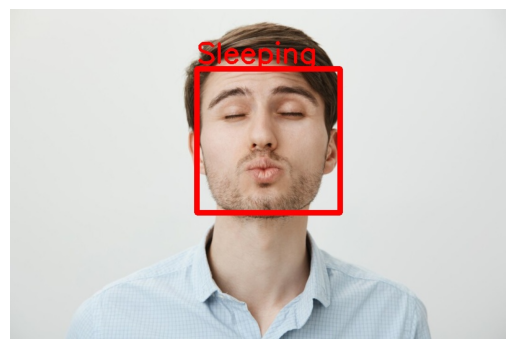

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy5.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

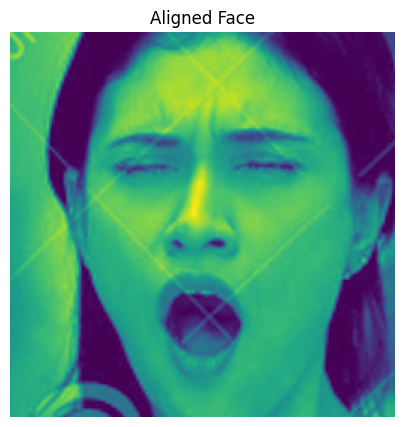

1/1 [==============================] - 0s 25ms/step


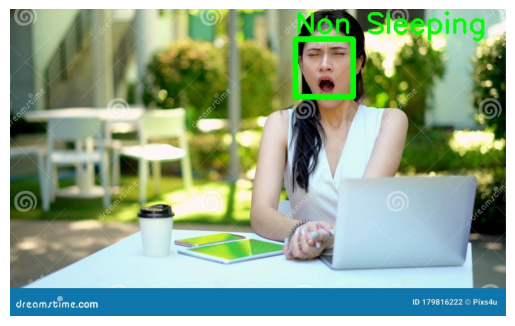

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy6.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

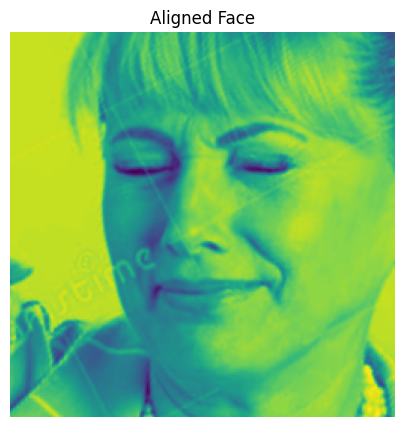

1/1 [==============================] - 0s 23ms/step


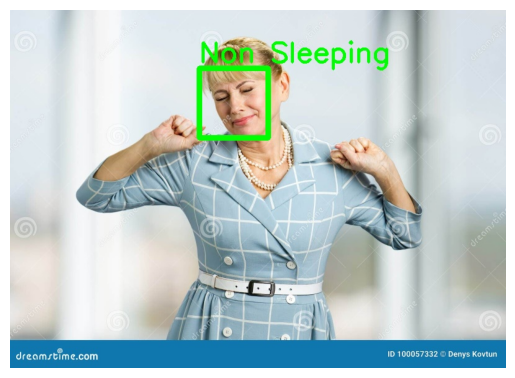

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy7.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

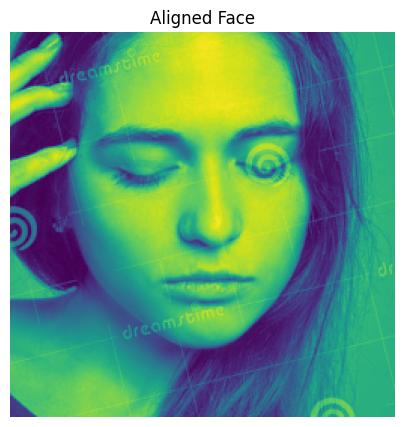

1/1 [==============================] - 0s 39ms/step


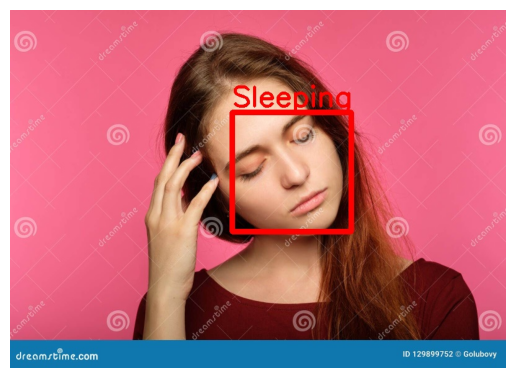

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy8.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

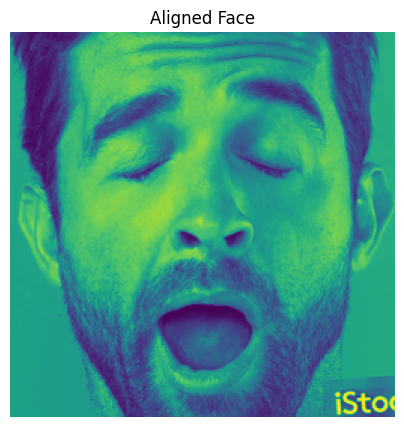

1/1 [==============================] - 0s 367ms/step


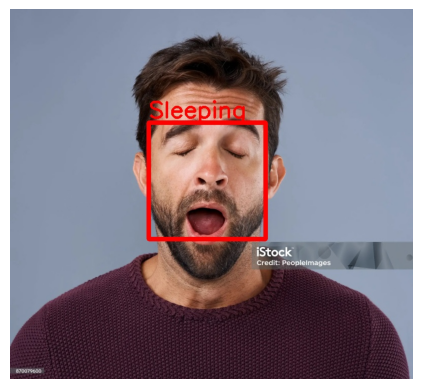

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy9.webp'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

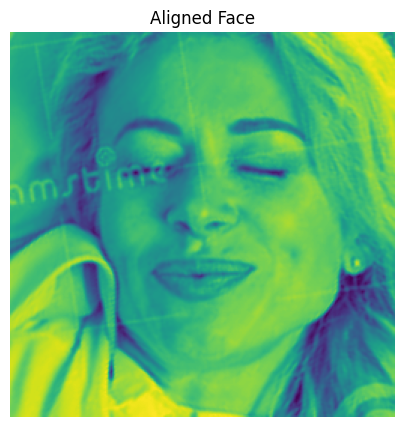

1/1 [==============================] - 0s 23ms/step


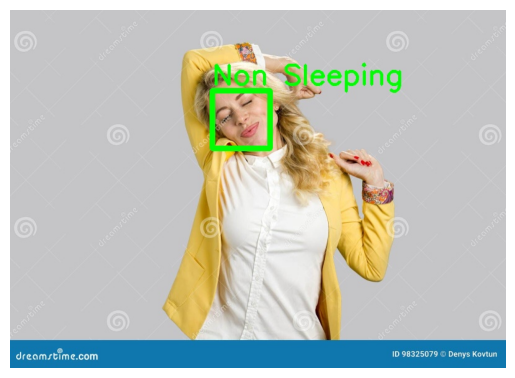

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/drowsy10.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

# Sleepy

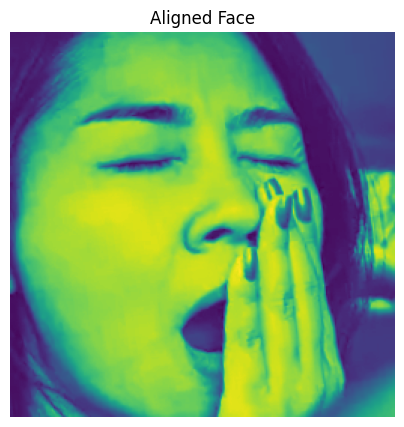

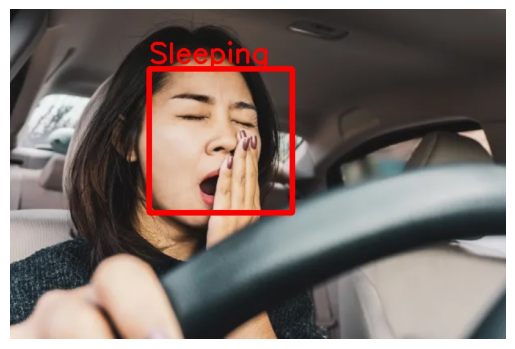

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy1.webp'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

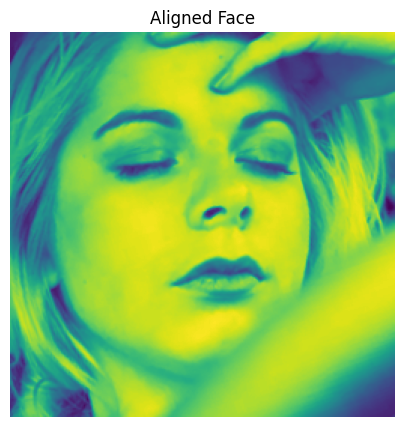

1/1 [==============================] - 0s 70ms/step


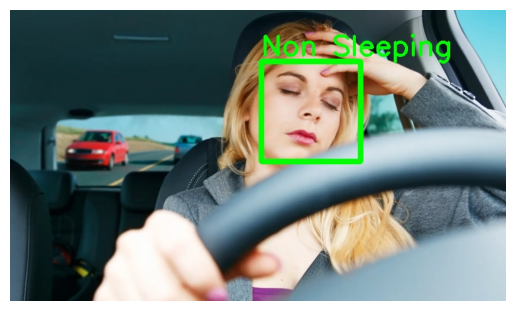

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy2.webp'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

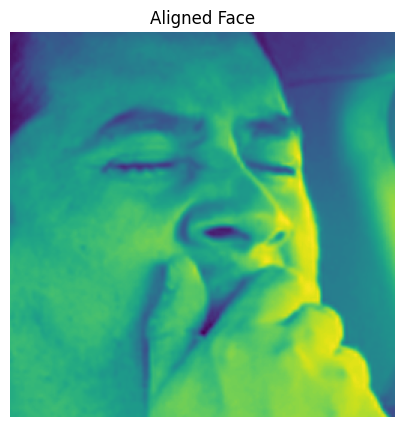

1/1 [==============================] - 0s 75ms/step


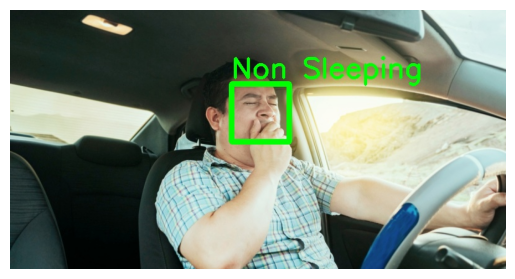

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy3.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

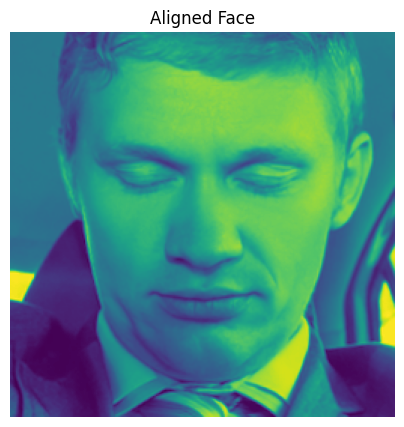

1/1 [==============================] - 0s 34ms/step


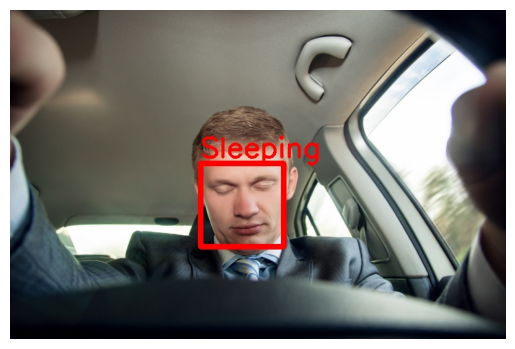

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy4.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

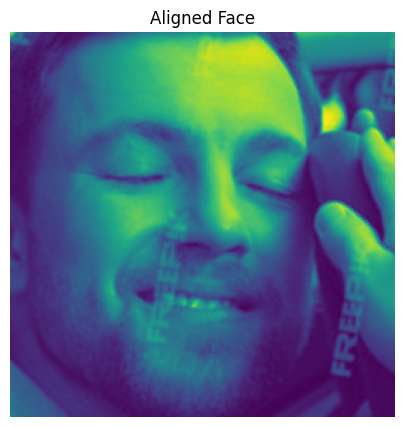

1/1 [==============================] - 0s 313ms/step


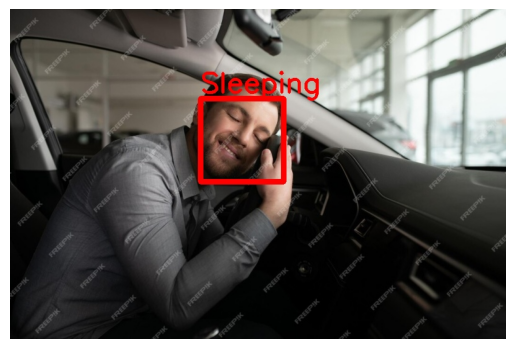

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy5.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

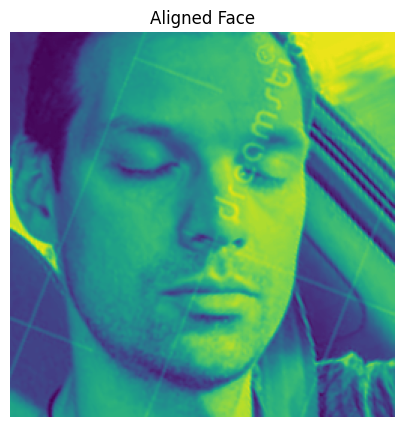

1/1 [==============================] - 0s 40ms/step


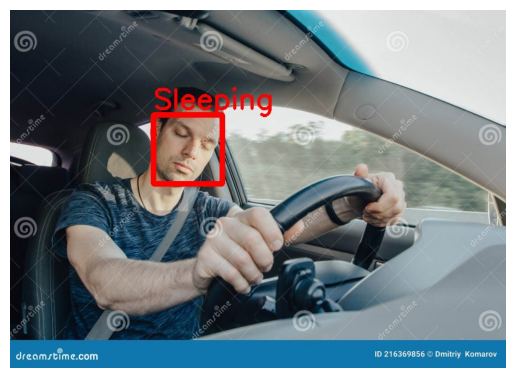

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy6.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

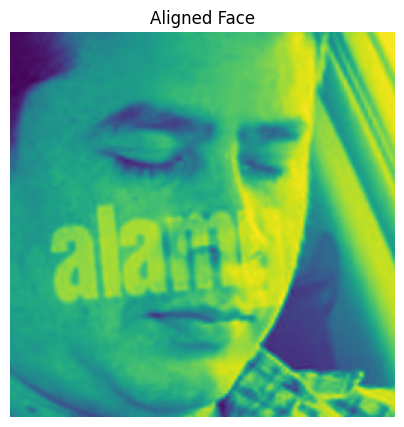

1/1 [==============================] - 0s 21ms/step


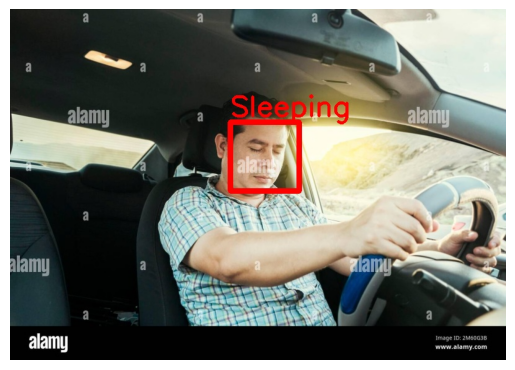

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy7.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

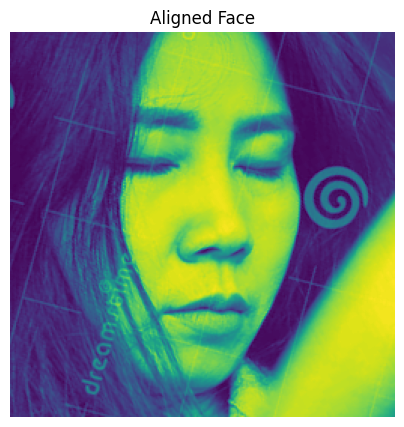

1/1 [==============================] - 0s 38ms/step


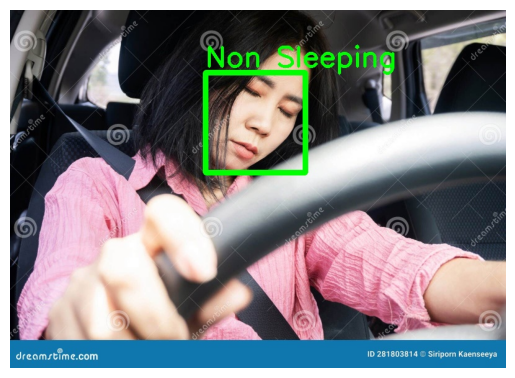

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy8.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

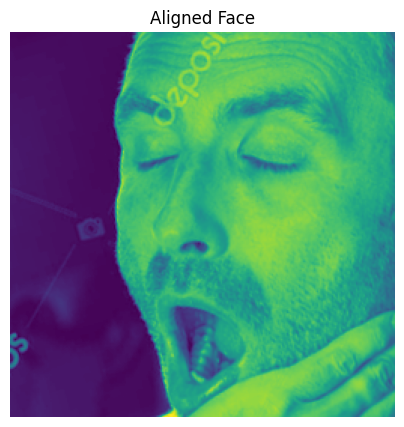

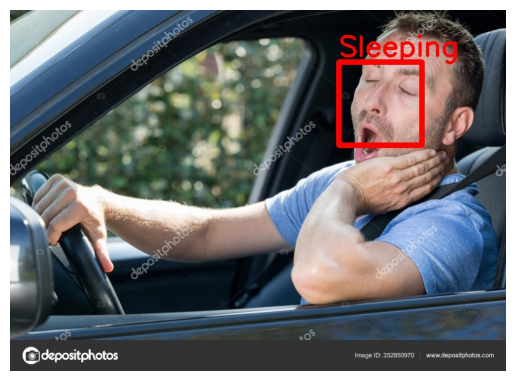

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy9.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

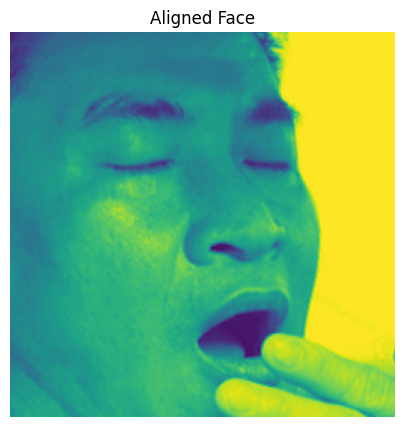

1/1 [==============================] - 0s 301ms/step


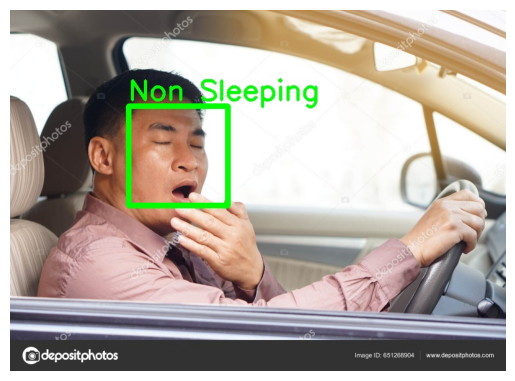

In [ ]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/drive/MyDrive/DATASET2/datasetKaggle2/predictions/fullFace/sleepy10.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()